### Welcome !

This notebook presents the Large Rocks dataset. 

Specifically, we will use YOLOv8, which is one of the most object detection models available.

#### The dataset:

The anntotions are provided in 63 tiles scattered around the swiss alps. 
There are comprehensive, meaning that all rocks satisfying the 5x5m size should be annotated. 
The geographic split is used to avoid bias toward certains areas or spatial characteristics.

Original swissIMAGE and swissSURFACE3D have a spatial resolution of 10cm, respectively 25cm. For this project we uniformized the data resolution to 50cm and cut images into tiles of smaller size (640x640pixels), with overlap of about 25%.

***The main difference between swissSURFACE3D and swissSURFACE3D hillshade*** : swissSURFACE3D contains actual elevation values in meters, while the hillshade layer is a view of the hillshade (terrain,landscape)  with brightness values on the swissSURFACE3D data. While we provide both datasets, we recommand to use the hillshade version for your intial experiements.  



## Annotations structures 

The annotations follow the [COCO Dataset format](/https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/md-coco-overview.html), with an annotation list: 
    
    
- the annotations of rocks for each images (list) :
    - abs_rock_coordinates : absolute rock coordinate as annotate by swisstopo in EPSG:2056 coordinates (increasing from the lower left corner)    
    - pixel_within_patch_coordinates : pixel in which swisstopo annotation occurs (number of pixel in x,y from upper left corner)
    - relative_within_patch_location : relative location of the objects within the images (pixel coordinates divided by the size of the images, here 640x640)
    - bbox size : size of the bounding box ( 10x10 pixel corresponds to 5x5m, at 50cm resolution)

With YOLO you will only use the annotations in term of relative location with the patch. If you decide to use another model, other ways to integrate annotations might be needed.


In [1]:
'''
data ={'info': {
                'description': 'Large Rocks Detection Dataset',
                'version': '1.0',
                'year': 2024,
                'contributor': 'Valerie Zermatten',
                'date_created': '2024/09/30'
        },
    'licenses': [{
                'url': 'https://shop.swisstopo.admin.ch/en/free-geodata',
                'name': 'Open Government Data (OGD)',
             }],
 'dataset': [{
                'id': 0,
                'file_name': '2581_1126_0_0.tif',
                'width': 640,
                'height': 640, 
                'split': 'test',
                'coord': [2781680.0, 1141000.0, 2782000.0, 1141320.0], # Coordinates of the patch (x_min,y_min,x_max,y_max) in EPSG:2056 coordinates
                'rocks_annotations': [
                    {
                    'rock_id': 1468.0,
                    'abs_rock_coordinates': [2581141.77, 1126915.1],
                    'pixel_within_patch_coordinates': (282.0, 173.0),
                    'relative_within_patch_location': (0.44, 0.27),
                    'bbox_size': [10, 10]
                    },
                ....
                    {
                    'rock_id': 1469.0,
                    'abs_rock_coordinates': [2581162.14, 1126875.17],
                    'pixel_within_patch_coordinates': (326.0, 250.0),
                    'relative_within_patch_location': (0.51, 0.39),
                ...}
             }],
}
'''

"\ndata ={'info': {\n                'description': 'Large Rocks Detection Dataset',\n                'version': '1.0',\n                'year': 2024,\n                'contributor': 'Valerie Zermatten',\n                'date_created': '2024/09/30'\n        },\n    'licenses': [{\n                'url': 'https://shop.swisstopo.admin.ch/en/free-geodata',\n                'name': 'Open Government Data (OGD)',\n             }],\n 'dataset': [{\n                'id': 0,\n                'file_name': '2581_1126_0_0.tif',\n                'width': 640,\n                'height': 640, \n                'split': 'test',\n                'coord': [2781680.0, 1141000.0, 2782000.0, 1141320.0], # Coordinates of the patch (x_min,y_min,x_max,y_max) in EPSG:2056 coordinates\n                'rocks_annotations': [\n                    {\n                    'rock_id': 1468.0,\n                    'abs_rock_coordinates': [2581141.77, 1126915.1],\n                    'pixel_within_patch_coordinates': (

### More details for YOLO usage :

For each bounding box in a patch, YOLO expects the coordinates of the box center, its width and height, and the class of the object contained in the bounding box to be represented by one line in the .txt-file, formatted as follows:
```
class center_x center_y width height
```
Note that YOLO expects coordinates, width, and height to be relative to the patch dimensions. E.g., assuming a 640x640 patch, and that the center of a bounding box of `width = 64`/`height = 32`, which contains an target object of category `1` is located at coordinate `(320, 160)`, the correct specification would be:
```
1 0.5 0.25 0.1 0.05
```
Also be aware :

- Patchifying an image comes at the risk of "cutting off" bounding boxes that span multiple patches. While we could simply discard bounding boxes that do not lie entirely within one patch, our model would then not learn to detect animals that are only partly present in a picture, which is undesirable.

- Some patches in the dataset do not contains any rocks annotations.  They are usefull for the model to learn "negative" samples. 

## How to read our dataset : 

In [2]:
import json
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from tifffile import tifffile 
#tifffile is a usefull and lightweight library to read raster images (.tif)
# example how to use tiffile here : https://pypi.org/project/tifffile/#examples
# install it with :
# ! pip install tifffile



In [8]:
# Illustration of some samples coming from the dataset
json_file_path = 'large_rock_dataset.json'

# Load the JSON file
with open(json_file_path, 'r') as file:
    data = json.load(file)
print('General information about the data:', data['info'])
dataset =data['dataset']
print('Number of samples  :', len(dataset) )
sample_info = dataset[10]
print('Looking at the the first images:', sample_info ['file_name'])
print('Looking at rocks annotations for the first images:\n', sample_info ['rocks_annotations'][0])

General information about the data: {'description': 'Large Rocks Detection Dataset', 'version': '1.0', 'year': 2024, 'contributor': 'Valerie Zermatten', 'date_created': '2024/09/30'}
Number of samples  : 992
Looking at the the first images: 2581_1126_2_2.tif
Looking at rocks annotations for the first images:
 {'rock_id': 1459.0, 'abs_rock_coordinates': [2581767.93, 1126509.48], 'pixel_within_patch_coordinates': [608.0, 51.0], 'relative_within_patch_location': [0.95, 0.08]}


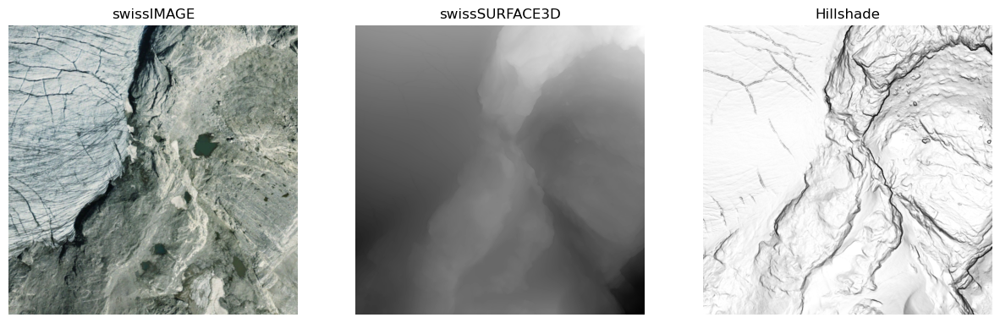

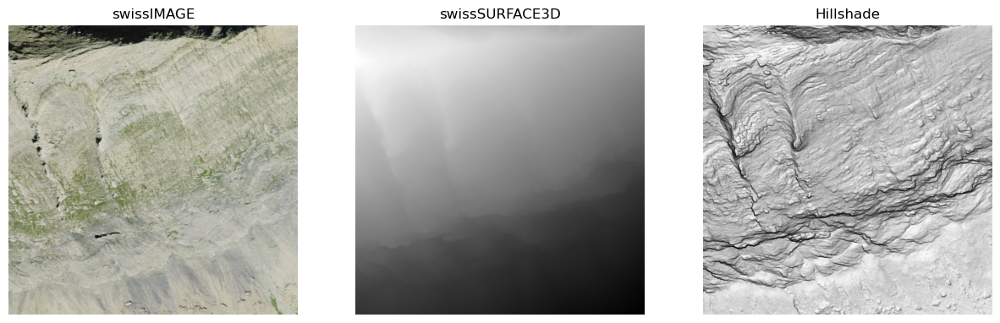

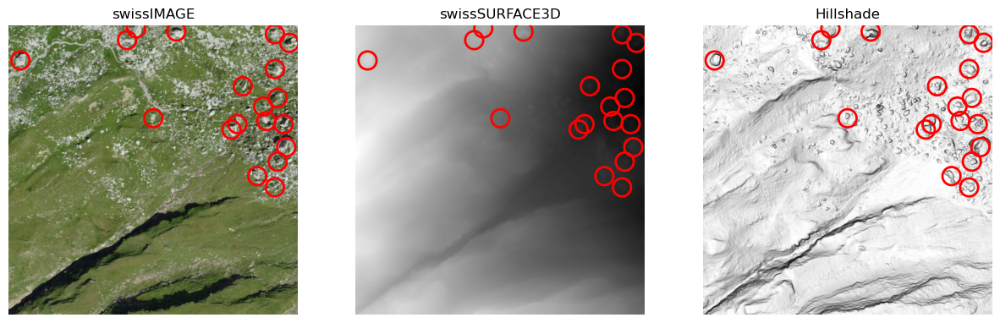

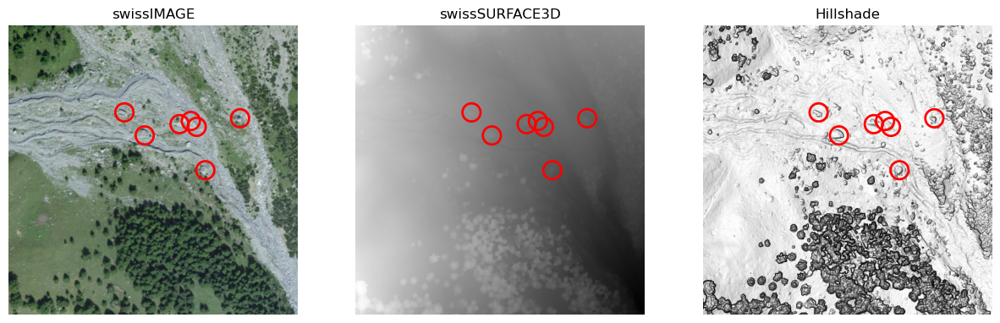

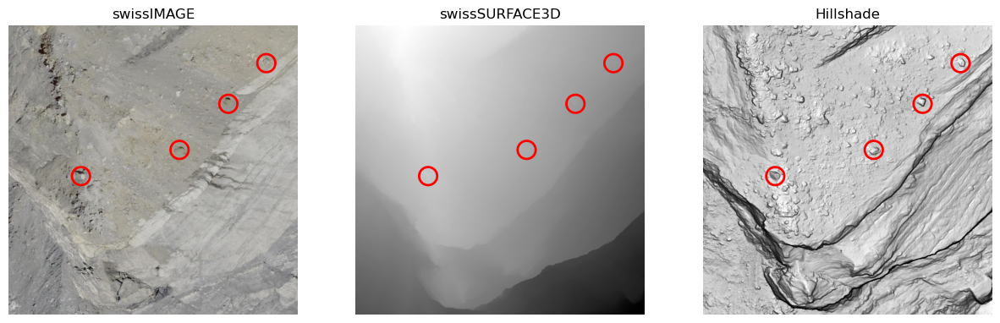

...

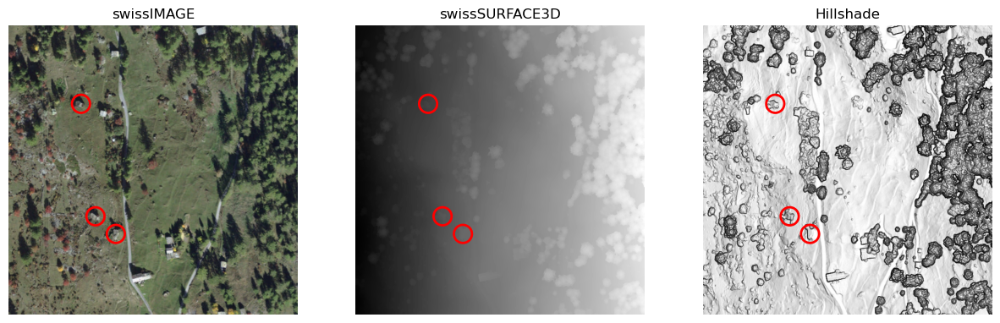

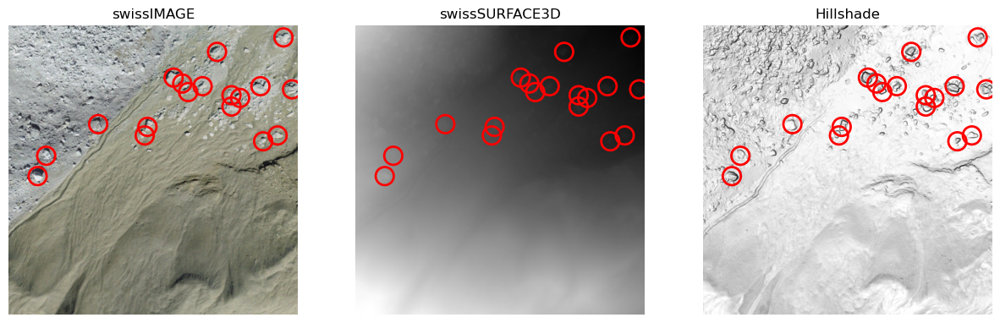

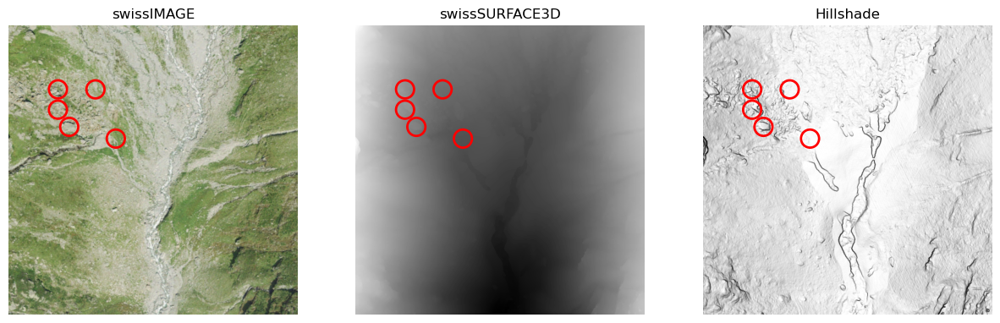

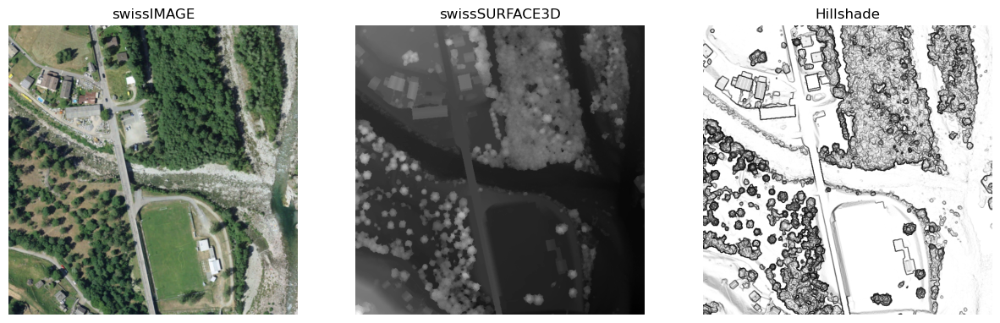

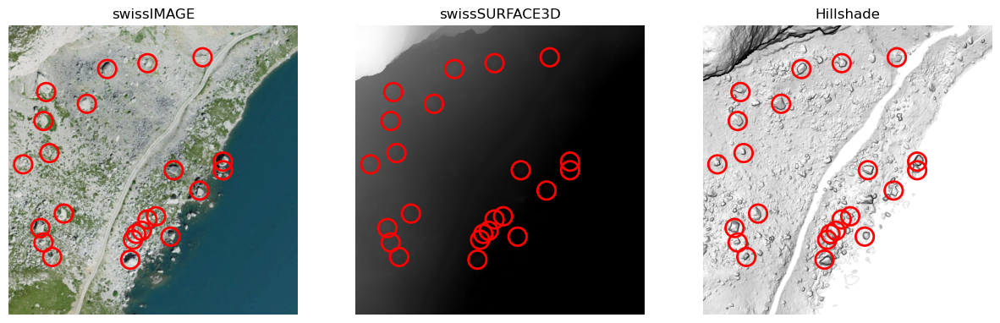

In [32]:
def plot_images_with_bboxes(sample_info):

    src_SI = 'swissImage_50cm_patches/' +sample_info ['file_name']
    src_SS = 'swissSURFACE3D_patches/'+sample_info ['file_name']
    src_HS = 'swissSURFACE3D_hillshade_patches/'+sample_info ['file_name']

    # Read and draw the bounding boxes
    bboxes = sample_info['rocks_annotations']  # Assuming each image has a 'annotations' field containing the bounding boxes

    #  Open and display the image
    image = tifffile.imread(src_SI)
    f, ax = plt.subplots(1,3)
    f.set_figheight(15)
    f.set_figwidth(15)
    ax[0].imshow(image)
    ax[0].axis('off')
    ax[0].title.set_text('swissIMAGE')

    for box in bboxes:
        x,y = box['pixel_within_patch_coordinates'] 
        # Draw the square as a patch (red square)
        rect = patches.Circle((x, y), radius=20,  linewidth=2, edgecolor='r', facecolor='none')
        ax[0].add_patch(rect)


    dsm = tifffile.imread(src_SS)
    ax[1].imshow(dsm, cmap='gist_gray')
    ax[1].axis('off')
    ax[1].title.set_text('swissSURFACE3D')

    for box in bboxes:
        x,y = box['pixel_within_patch_coordinates'] 
        # Draw the square as a patch (red square) of size 20 pixel (10m)
        rect = patches.Circle((x, y), radius=20,  linewidth=2, edgecolor='r', facecolor='none')         
        ax[1].add_patch(rect)

    hs = tifffile.imread(src_HS)
    ax[2].imshow(hs, cmap='gist_gray')
    ax[2].axis('off')
    ax[2].title.set_text('Hillshade')

    for box in bboxes:
        x,y = box['pixel_within_patch_coordinates'] 
        # Draw the square as a patch (red square) of size 20 pixel (10m)
        rect = patches.Circle((x, y), radius=20,  linewidth=2, edgecolor='r', facecolor='none')         
        ax[2].add_patch(rect)

    # Show the plot with bounding boxes
    plt.show()

for k in range(15):
    random.shuffle(dataset)
    plot_images_with_bboxes(dataset[k])

